<a href="https://colab.research.google.com/github/xu-pu/colab-notebooks/blob/master/double_pendulum_simulation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Derive the Equations of Motion (EoM) of Double Pendulum

In [17]:
from sympy import *
init_printing()

Declare symbols

In [18]:
t, g, l1, l2, m1, m2, ddq1, ddq2 = symbols('t g l_1 l_2 m_1 m_2 \ddot{q_1} \ddot{q_2}')
q1 = Function('q_1')(t)
q2 = Function('q_2')(t)
dq1 = Function('\dot{q_1}')(t)
dq2 = Function('\dot{q_2}')(t)
t, g, l1, l2, m1, m2, q1, q2, dq1, dq2, ddq1, ddq2

Derive the positions and velocities of the centers of mass

In [19]:
x1 = l1 * cos(q1)
y1 = -l1 * sin(q1)
x2 = x1 + l2 * cos(q1+q2)
y2 = y1 - l2 * sin(q1+q2)

# substitution rules
rule = [(q1.diff(t),dq1),(q2.diff(t),dq2), (dq1.diff(t),ddq1), (dq2.diff(t),ddq2)]

dx1 = x1.diff(t).subs(rule)
dy1 = y1.diff(t).subs(rule)
dx2 = x2.diff(t).subs(rule)
dy2 = y2.diff(t).subs(rule)

Derive the Lagrangian $\mathcal{L} = T-V$

In [20]:
T1 = S.Half * m1 * (dx1**2 + dy1**2)
T2 = S.Half * m2 * (dx2**2 + dy2**2)

V1 = m1 * g * y1
V2 = m2 * g * y2

T = T1+T2
V = V1+V2

L = T-V

Construct the Euler-Lagrange Equation
$$
\frac{d}{d t} \frac{\partial \mathcal{L}}{\partial \dot{q}}-\frac{\partial \mathcal{L}}{\partial q} = 0
$$

In [21]:
eq1 = L.diff(dq1).diff(t) - L.diff(q1)
eq1 = eq1.subs(rule)
eq1 = simplify(eq1)


eq2 = L.diff(dq2).diff(t) - L.diff(q2)
eq2 = eq2.subs(rule)
eq2 = simplify(eq2)

Solve for $\ddot{q}$

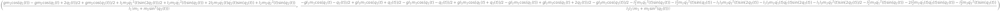

In [22]:
ans = solve((Eq(eq1,0),Eq(eq2,0)),(ddq1, ddq2))
sol_ddq1 = simplify(ans[ddq1])
sol_ddq2 = simplify(ans[ddq2])
sol_ddq1, sol_ddq2

# Construct the Equations of Motion (EoM) in Matrix Form

$$
\text{Equations of Motion:} \ \dot{y} = f(\theta, y)
$$

$$
\text{where}\ y = (q,\dot{q}),\ \dot{y} = (\dot{q}, \ddot{q}),\ \theta=(m_1, m_2, l_1, l_2, g)
$$

In [23]:
y = MatrixSymbol('y',4,1)
theta = MatrixSymbol('theta',5,1)

# substitution rules
rules_eom = [
    (m1, theta[0,0]),
    (m2, theta[1,0]),
    (l1, theta[2,0]),
    (l2, theta[3,0]),
    (g,  theta[4,0]),
    (q1, y[0,0]),
    (q2, y[1,0]),
    (dq1, y[2,0]),
    (dq2, y[3,0])
    ]

# right hand side
eom_rhs = ImmutableMatrix([
    y[2,0],
    y[3,0],
    sol_ddq1.subs(rules_eom),
    sol_ddq2.subs(rules_eom)
])

# Code Generation for Python

In [24]:
f = lambdify([theta, y], eom_rhs, 'numpy')

In [25]:
f.__globals__['array']

<function numpy.array>

In [26]:
import inspect
from IPython.display import display, Code
code = inspect.getsource(f)
display(Code(code, language='python'))

def _lambdifygenerated(theta, y):
    return (array([[y[2, 0]], [y[3, 0]], [(sin(y[1, 0])*theta[1, 0]*theta[3, 0]*y[2, 0]**2 + 2*sin(y[1, 0])*theta[1, 0]*theta[3, 0]*y[2, 0]*y[3, 0] + sin(y[1, 0])*theta[1, 0]*theta[3, 0]*y[3, 0]**2 + (1/2)*sin(2*y[1, 0])*theta[1, 0]*theta[2, 0]*y[2, 0]**2 - 1/2*cos(y[0, 0] + 2*y[1, 0])*theta[1, 0]*theta[4, 0] + cos(y[0, 0])*theta[0, 0]*theta[4, 0] + (1/2)*cos(y[0, 0])*theta[1, 0]*theta[4, 0])/((sin(y[1, 0])**2*theta[1, 0] + theta[0, 0])*theta[2, 0])], [(-sin(y[1, 0])*theta[0, 0]*theta[2, 0]**2*y[2, 0]**2 - sin(y[1, 0])*theta[1, 0]*theta[2, 0]**2*y[2, 0]**2 - sin(y[1, 0])*theta[1, 0]*theta[3, 0]**2*y[2, 0]**2 - 2*sin(y[1, 0])*theta[1, 0]*theta[3, 0]**2*y[2, 0]*y[3, 0] - sin(y[1, 0])*theta[1, 0]*theta[3, 0]**2*y[3, 0]**2 - sin(2*y[1, 0])*theta[1, 0]*theta[2, 0]*theta[3, 0]*y[2, 0]**2 - sin(2*y[1, 0])*theta[1, 0]*theta[2, 0]*theta[3, 0]*y[2, 0]*y[3, 0] - 1/2*sin(2*y[1, 0])*theta[1, 0]*theta[2, 0]*theta[3, 0]*y[3, 0]**2 - 1/2*cos(y[0, 0] - y[1, 0])*theta[0, 0]*theta[2, 0]*theta[4, 0] - 1/2*cos(y[0, 0] - y[1, 0])*theta[1, 0]*theta[2, 0]*theta[4, 0] + (1/2)*cos(y[0, 0] + y[1, 0])*theta[0, 0]*theta[2, 0]*theta[4, 0] + (1/2)*cos(y[0, 0] + y[1, 0])*theta[1, 0]*theta[2, 0]*theta[4, 0] + (1/2)*cos(y[0, 0] + 2*y[1, 0])*theta[1, 0]*theta[3, 0]*theta[4, 0] - cos(y[0, 0])*theta[0, 0]*theta[3, 0]*theta[4, 0] - 1/2*cos(y[0, 0])*theta[1, 0]*theta[3, 0]*theta[4, 0])/((sin(y[1, 0])**2*theta[1, 0] + theta[0, 0])*theta[2, 0]*theta[3, 0])]]))

# Simulate

In [27]:
from scipy.integrate import solve_ivp
import numpy as np

In [39]:
class DoublePendulumSystem:
  
  def __init__(self, m1, m2, l1, l2):
    self.l1 = l1
    self.l2 = l2
    self.m1 = m1
    self.m2 = m2
    self.g = 9.8
    self.theta = np.array([[self.m1,self.m2,self.l1,self.l2,self.g]]).T
    self.f = lambdify([theta, y], eom_rhs, 'numpy')
    self.x1 = lambdify([theta, y], x1.subs(rules_eom))
    self.y1 = lambdify([theta, y], y1.subs(rules_eom))
    self.x2 = lambdify([theta, y], x2.subs(rules_eom))
    self.y2 = lambdify([theta, y], y2.subs(rules_eom))

  def ode(self, t, y):
    return self.f(self.theta, y.reshape(4,1)).reshape(4,)

  def y2pt(self, y):
    y = y.reshape((4,1))
    p1 = np.array([
        self.x1(self.theta, y), 
        self.y1(self.theta, y)
    ])
    p2 = np.array([
        self.x2(self.theta, y), 
        self.y2(self.theta, y)
    ])
    return np.array([[0,0], p1, p2])

  def vy2vpt(self, vy):
    frame_count, ydim = vy.shape
    assert(ydim == 4)
    return np.array([self.y2pt(vy[i,:]) for i in range(frame_count)])

system = DoublePendulumSystem(1,1,1,1)
system.theta.shape

In [49]:
fps = 15
duration = 60
frames = fps * duration
interval = 1000 / fps
length = 1

rst1 = solve_ivp(
    system.ode, 
    (0,duration), 
    (np.deg2rad(45),0,0,0),
    t_eval = np.linspace(0,duration,duration*fps)
)

rst2 = solve_ivp(
    system.ode, 
    (0,duration), 
    (np.deg2rad(45),np.deg2rad(5),0,0),
    t_eval = np.linspace(0,duration,duration*fps)
)

In [50]:
vpt1 = system.vy2vpt(rst1.y.T)
vpt2 = system.vy2vpt(rst2.y.T)

In [51]:
# Animation

%matplotlib inline

import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML

# First set up the figure, the axis, and the plot element we want to animate
fig, ax = plt.subplots()

ax.set_aspect('equal')
ax.set_xlim(( -2, 2))
ax.set_ylim((-3, 1))

line1, = ax.plot([], [], lw=1, marker="o")
line2, = ax.plot([], [], lw=1, marker="o")

# initialization function: plot the background of each frame
def init():
    line1.set_data([], [])
    line2.set_data([], [])
    return (line1, line2,)

# animation function. This is called sequentially
def animate(i):
    pts1 = vpt1[i,:]
    pts2 = vpt2[i,:]
    line1.set_data(pts1[:,0],pts1[:,1])
    line2.set_data(pts2[:,0],pts2[:,1])
    return (line1, line2,)

# call the animator. blit=True means only re-draw the parts that have changed.
anim = animation.FuncAnimation(fig, animate, init_func=init, frames=frames, interval=interval, blit=True)
plt.close()

# frames is i, interval is ms between frames

HTML(anim.to_jshtml())